# Setup and Configuration

We import the necessary libraries, set random seeds for reproducibility, discover the project root, configure GPU/CPU devices, and create the output directories.

In [1]:
import os
import sys
import random
import time
import json
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, r2_score, root_mean_squared_error
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, confusion_matrix
import xgboost as xgb
from xgboost import XGBRegressor, XGBClassifier
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

def find_project_root():
    candidates = [Path.cwd().resolve(), *Path.cwd().resolve().parents]
    for cand in candidates:
        if (cand / "data").exists() and (cand / "d_models").exists():
            return cand
    raise FileNotFoundError("Could not locate repo root containing 'data'")

PROJECT_ROOT = find_project_root()
print(f"Project root found: {PROJECT_ROOT}")

# Append project root to sys.path
sys_path_root = str(PROJECT_ROOT)
if sys_path_root not in sys.path:
    sys.path.append(sys_path_root)

# Define out_dir globally
out_dir = PROJECT_ROOT / "notebooks/experiment/derived_8.2-eval-3.0"
out_dir.mkdir(parents=True, exist_ok=True)
print(f"Output directory: {out_dir}")

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
os.environ["PYTHONHASHSEED"] = str(SEED)
print(f"Random seed set to {SEED}")

# Setup plotting style
plt.style.use("default")
plt.rcParams["figure.figsize"] = (8, 5)
plt.rcParams["axes.grid"] = True

# Verify CUDA/GPU availability for XGBoost
try:
    dummy = xgb.XGBRegressor(n_estimators=1, device="cuda")
    dummy.fit(np.array([[1.0]]), np.array([1.0]))
    XGB_DEVICE = "cuda"
    print("XGBoost CUDA support verified and enabled.")
except Exception as e:
    XGB_DEVICE = "cpu"
    print(f"XGBoost CUDA test failed ({e}). Falling back to CPU.")

print("Setup complete. Using device:", XGB_DEVICE)



Project root found: C:\Users\pan\Documents\GitHub\MDR-Project
Output directory: C:\Users\pan\Documents\GitHub\MDR-Project\notebooks\experiment\derived_8.2-eval-3.0
Random seed set to 42
XGBoost CUDA support verified and enabled.
Setup complete. Using device: cuda


# Section 2: Load Data Splits and Preprocessing

We load the `derived_8.2` train, val, and test splits, parse the dates, extract temporal features (month, year), and construct the combined `trainval` dataset.

In [2]:
# Load data splits
TRAIN_PATH = PROJECT_ROOT / "data/splits/derived_8.2/train.csv"
VAL_PATH = PROJECT_ROOT / "data/splits/derived_8.2/val.csv"
TEST_PATH = PROJECT_ROOT / "data/splits/derived_8.2/test.csv"

train_df = pd.read_csv(TRAIN_PATH)
val_df = pd.read_csv(VAL_PATH)
test_df = pd.read_csv(TEST_PATH)

print("Dataset splits loaded:")
print(f"  train: {train_df.shape}")
print(f"  val:   {val_df.shape}")
print(f"  test:  {test_df.shape}")

# Parse date, extract month and year
for df in [train_df, val_df, test_df]:
    df["date"] = pd.to_datetime(df["date"])
    df["month"] = df["date"].dt.month.astype(int)
    df["year"] = df["date"].dt.year.astype(float)

# Concatenate train and val for training/validation (trainval)
trainval_df = pd.concat([train_df, val_df], axis=0).reset_index(drop=True)
print(f"  trainval (concatenated): {trainval_df.shape}")

Dataset splits loaded:
  train: (15704, 499)
  val:   (7149, 499)
  test:  (8902, 499)
  trainval (concatenated): (22853, 500)


C:\Users\pan\AppData\Local\Temp\ipykernel_23004\1768728799.py:18: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["month"] = df["date"].dt.month.astype(int)
C:\Users\pan\AppData\Local\Temp\ipykernel_23004\1768728799.py:18: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["month"] = df["date"].dt.month.astype(int)
C:\Users\pan\AppData\Local\Temp\ipykernel_23004\1768728799.py:18: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

# Section 3: Feature Sets and Metadata

We load the selected features for the baseline model and regime-specific specialist models from `dataset_metadata.py`. Once the background feature selection process is complete, we will also load the cluster-specific feature sets from `cluster_features.json`.

In [3]:
# Load Feature V3 and regime features from metadata
import importlib.util
metadata_path = PROJECT_ROOT / "data/splits/derived_8.2/dataset_metadata.py"
spec = importlib.util.spec_from_file_location("dataset_metadata", metadata_path)
dataset_metadata = importlib.util.module_from_spec(spec)
spec.loader.exec_module(dataset_metadata)

# Base feature set and target
TARGET_COL = "soil_moisture_5cm"
FEATURE_SET_V3 = dataset_metadata.OVERALL_SELECTED_FEATURES_V3

# Regime-specific features
REGIME_FEATURES = {
    "binary": {
        "dry": dataset_metadata.BINARY_REGIME_DRY_SELECTED_FEATURES_V1,
        "wet": dataset_metadata.BINARY_REGIME_WET_SELECTED_FEATURES_V1
    },
    "ternary": {
        "dry": dataset_metadata.TERNARY_REGIME_DRY_SELECTED_FEATURES_V1,
        "transition": dataset_metadata.TERNARY_REGIME_TRANSITION_SELECTED_FEATURES_V1,
        "wet": dataset_metadata.TERNARY_REGIME_WET_SELECTED_FEATURES_V1
    }
}

# Thresholds
T_BINARY = dataset_metadata.BINARY_REGIME_THRESHOLD
T_TERNARY_DRY = dataset_metadata.TERNARY_REGIME_DRY_THRESHOLD
T_TERNARY_WET = dataset_metadata.TERNARY_REGIME_WET_THRESHOLD

print(f"Feature Set V3 count: {len(FEATURE_SET_V3)}")
print(f"Binary dry features: {len(REGIME_FEATURES['binary']['dry'])}, wet features: {len(REGIME_FEATURES['binary']['wet'])}")
print(f"Ternary dry features: {len(REGIME_FEATURES['ternary']['dry'])}, transition features: {len(REGIME_FEATURES['ternary']['transition'])}, wet features: {len(REGIME_FEATURES['ternary']['wet'])}")

Feature Set V3 count: 47
Binary dry features: 27, wet features: 45
Ternary dry features: 27, transition features: 50, wet features: 6


# Section 4: Evaluation, Plotting, and Model Weight Helpers

We define helper functions to calculate performance metrics (including $R^2$, RMSE, ubRMSE, Bias, MAE, Med|Err|, and Pearson correlation), plot diagnostic figures (True vs. Predicted and True vs. Residual plots for both overall and year-by-year splits), save/load trained models, and generate the multi-model line chart comparison.

In [4]:
import matplotlib.cm as cm

# Quantile binner helper
class QuantileBinner:
    def __init__(self, K):
        self.K = K
        self.thresholds = []
        
    def fit(self, series):
        val = series.fillna(series.mean())
        self.thresholds = [val.quantile(i / self.K) for i in range(1, self.K)]
        
    def predict(self, series):
        val = series.fillna(series.mean())
        if self.K == 2:
            return np.where(val < self.thresholds[0], 0, 1)
        elif self.K == 3:
            return np.where(val < self.thresholds[0], 0, np.where(val < self.thresholds[1], 1, 2))
        else:
            raise NotImplementedError("Only K=2 and K=3 implemented")

# KMeans clustering helper
class KMeansClusterer:
    def __init__(self, cols, K):
        self.cols = cols
        self.K = K
        self.means = None
        self.scaler = StandardScaler()
        self.kmeans = KMeans(n_clusters=K, random_state=42, n_init=10)
        
    def fit(self, df):
        X = df[self.cols].copy()
        self.means = X.mean()
        X = X.fillna(self.means)
        X_scaled = self.scaler.fit_transform(X)
        self.kmeans.fit(X_scaled)
        
    def predict(self, df):
        X = df[self.cols].copy()
        X = X.fillna(self.means)
        X_scaled = self.scaler.transform(X)
        return self.kmeans.predict(X_scaled)

# Metric computation helper
def compute_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).ravel()
    y_pred = np.asarray(y_pred).ravel()
    err = y_true - y_pred
    ae = np.abs(err)
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = root_mean_squared_error(y_true, y_pred)
    ubrmse = np.sqrt(np.mean(((y_true - np.mean(y_true)) - (y_pred - np.mean(y_pred))) ** 2))
    bias = np.mean(err)
    med_ae = np.median(ae)
    if np.std(y_true) == 0 or np.std(y_pred) == 0:
        pearson = float("nan")
    else:
        pearson = np.corrcoef(y_true, y_pred)[0, 1]
    return {
        "R2": r2, "RMSE": rmse, "ubRMSE": ubrmse, "Bias": bias, "MAE": mae, "Med|Err|": med_ae, "Pearson": pearson
    }

# Diagnostic plotting helper (2x4 grid of True vs Pred and Residuals)
def plot_diagnostics(name, y_test, pred_test, test_df, out_dir):
    y_test = np.asarray(y_test).ravel()
    pred_test = np.asarray(pred_test).ravel()
    res = y_test - pred_test
    
    test_years = sorted(test_df["year"].unique())
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    
    # ------------------ Overall ------------------
    # True vs Pred
    ax = axes[0, 0]
    ax.scatter(y_test, pred_test, s=8, alpha=0.5, color="#1f77b4")
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], "k--", lw=1.5)
    ax.set_xlabel("True Soil Moisture")
    ax.set_ylabel("Predicted Soil Moisture")
    ax.set_title(f"Overall True vs Pred\nR2 = {r2_score(y_test, pred_test):.4f}")
    ax.grid(True, linestyle="--", alpha=0.6)
    
    # True vs Residual
    ax = axes[1, 0]
    ax.scatter(y_test, res, s=8, alpha=0.5, color="#d62728")
    ax.axhline(0, color="k", linestyle="--", lw=1.5)
    ax.set_xlabel("True Soil Moisture")
    ax.set_ylabel("Residual (true - pred)")
    ax.set_title("Overall Residuals")
    ax.grid(True, linestyle="--", alpha=0.6)
    
    # ------------------ Yearly ------------------
    for idx_yr, yr in enumerate(test_years):
        col_idx = idx_yr + 1
        mask = (test_df["year"] == yr).values
        y_yr = y_test[mask]
        pred_yr = pred_test[mask]
        res_yr = res[mask]
        
        # True vs Pred
        ax = axes[0, col_idx]
        ax.scatter(y_yr, pred_yr, s=8, alpha=0.5, color="#1f77b4")
        if len(y_yr) > 0:
            ax.plot([y_yr.min(), y_yr.max()], [y_yr.min(), y_yr.max()], "k--", lw=1.5)
        ax.set_xlabel("True Soil Moisture")
        ax.set_ylabel("Predicted Soil Moisture")
        ax.set_title(f"Year {int(yr)} True vs Pred\nR2 = {r2_score(y_yr, pred_yr) if len(y_yr) > 1 else float('nan'):.4f}")
        ax.grid(True, linestyle="--", alpha=0.6)
        
        # True vs Residual
        ax = axes[1, col_idx]
        ax.scatter(y_yr, res_yr, s=8, alpha=0.5, color="#d62728")
        ax.axhline(0, color="k", linestyle="--", lw=1.5)
        ax.set_xlabel("True Soil Moisture")
        ax.set_ylabel("Residual (true - pred)")
        ax.set_title(f"Year {int(yr)} Residuals")
        ax.grid(True, linestyle="--", alpha=0.6)
        
    plt.suptitle(f"Model Diagnostics: {name}", fontsize=16, fontweight="bold", y=0.98)
    plt.tight_layout()
    
    # Save figure
    fn = f"diagnostics_{name.lower().replace(' ', '_').replace('=', '').replace('(', '').replace(')', '')}.png"
    plt.savefig(out_dir / fn, dpi=300)
    plt.show()
    plt.close()

# Line chart generator helper for performance over the years
def plot_yearly_performance_linechart(metrics_by_year_df, out_dir):
    fig, ax = plt.subplots(figsize=(12, 7))
    models = metrics_by_year_df["Model Name"].unique()
    
    colors = cm.tab20(np.linspace(0, 1, len(models)))
    markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'h', 'x']
    
    for idx, model_name in enumerate(models):
        df_model = metrics_by_year_df[metrics_by_year_df["Model Name"] == model_name].sort_values("Year")
        years = df_model["Year"].values
        r2_vals = df_model["R2"].values
        
        ax.plot(years, r2_vals, label=model_name, color=colors[idx], marker=markers[idx % len(markers)], linewidth=2)
        
    ax.set_xticks([2023, 2024, 2025])
    ax.set_xticklabels(["2023", "2024", "2025"])
    ax.set_xlabel("Test Year", fontweight="bold")
    ax.set_ylabel("$R^2$ Score", fontweight="bold")
    ax.set_title("Model R2 Performance Over Test Years (2023-2025)", fontsize=14, fontweight="bold")
    ax.grid(True, linestyle="--", alpha=0.6)
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
    plt.tight_layout()
    plt.savefig(out_dir / "r2_performance_over_years.png", dpi=300)
    plt.show()
    plt.close()

# Model saving helpers
def get_model_path(name, suffix="", is_classifier=False):
    t = "clf" if is_classifier else "reg"
    s = f"_{suffix}" if suffix else ""
    return out_dir / "models" / f"{name.lower().replace(' ', '_')}_{t}{s}.json"

def save_model(model, name, suffix="", is_classifier=False):
    path = get_model_path(name, suffix, is_classifier)
    model.save_model(str(path))
    print(f"Saved weights to {path.name}")

def load_model(model, name, suffix="", is_classifier=False):
    path = get_model_path(name, suffix, is_classifier)
    if path.exists():
        model.load_model(str(path))
        print(f"Loaded weights from {path.name}")
        return True
    return False



# Section 5: Load Unsupervised Cluster Features

We load the cluster-specific feature sets selected by the background process from `cluster_features.json`.

In [5]:
import json

cluster_features_path = out_dir / "cluster_features.json"
if cluster_features_path.exists():
    with open(cluster_features_path, "r") as f:
        cluster_features = json.load(f)
    print("Successfully loaded cluster features!")
    for strat, cl_feats in cluster_features.items():
        print(f"Strategy: {strat}")
        for cl, feats in cl_feats.items():
            print(f"  Cluster {cl}: {len(feats)} features selected (e.g. {feats[:3]})")
else:
    print("[WARNING] cluster_features.json not found! Please run the feature selection script first.")
    cluster_features = {}

Successfully loaded cluster features!
Strategy: Univariate_G_API_k2
  Cluster 0: 22 features selected (e.g. ['A_d_E_SAR_diff_kobs30', 'A_grad_E_SAR_diff_kobs30', 'C_lag_E_SAR_ratio_kobs30'])
  Cluster 1: 1 features selected (e.g. ['J_aspect_deg'])
Strategy: Clustering_Dynamic_k2
  Cluster 0: 49 features selected (e.g. ['A_d_E_SAR_diff_kobs30', 'A_d_E_SAR_ratio_kobs30', 'A_grad_E_SAR_diff_kobs30'])
  Cluster 1: 47 features selected (e.g. ['C_lag_s2_b11_kobs30', 'D_cos_DOY', 'D_sin_DOY'])
Strategy: Seasonal_Binary_k2
  Cluster 0: 49 features selected (e.g. ['A_d_E_SAR_ratio_kobs30', 'A_grad_E_SAR_ratio_kobs30', 'D_cos_DOY'])
  Cluster 1: 34 features selected (e.g. ['A_d_F_NDMI_kobs30', 'A_grad_F_NDMI_kobs30', 'D_cos_DOY'])
Strategy: Clustering_V3_Full_k3
  Cluster 0: 44 features selected (e.g. ['API_x_year', 'DOY', 'D_cos_DOY'])
  Cluster 1: 8 features selected (e.g. ['D_sin_DOY', 'V_ema_F_NDVI_kobs30', 'V_ema_G_API_kobs14'])
  Cluster 2: 48 features selected (e.g. ['API_x_year', 'A_d_E_

# Section 6: Model Training and Prediction Loop

We define and train all 11 models on the `trainval` split (with specialists trained on their respective routed subsets). If saved model weights are found in the `models/` subdirectory, we load them directly for speed. All regressors use the SOTA XGBoost hyperparameters from `derived_8.2-hyperparameters-1.3-lite`. We compute predictions on the `test` split, measure gating performance for the learned routers, generate diagnostic plots for each model, and accumulate metrics.


RUNNING MODEL 1: Model 1: Baseline V3


Loaded weights from model_1:_baseline_v3_reg.json
Overall test score R2 = 0.6551


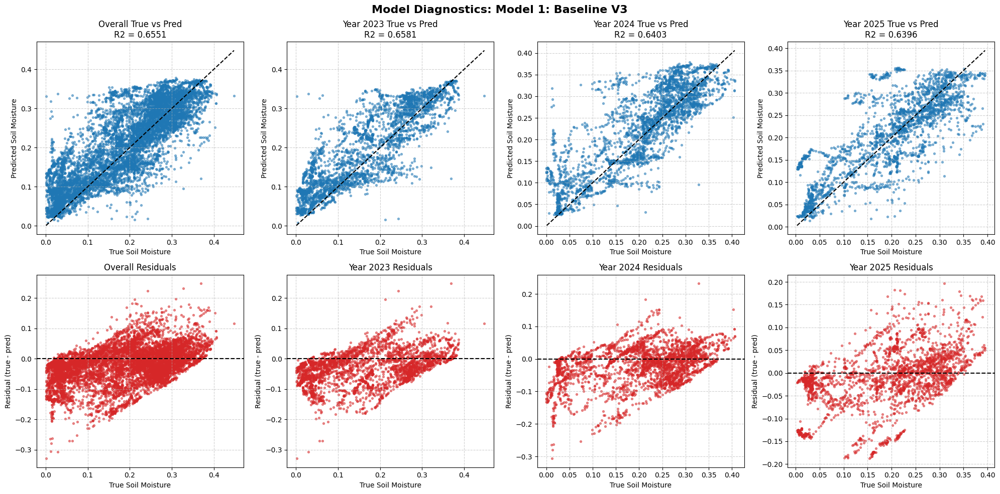


RUNNING MODEL 2: Model 2: Trained Gating K=2 (Spec)


Loaded weights from model_2:_trained_gating_k=2_(spec)_clf_gating.json
Gating classifier performance on test set:
  Accuracy:  0.8729
  F1-Score:  0.8645
  Confusion Matrix:
[[2771  586]
 [ 545 5000]]


Loaded weights from model_2:_trained_gating_k=2_(spec)_specialist_0_reg.json


Loaded weights from model_2:_trained_gating_k=2_(spec)_specialist_1_reg.json
Overall test score R2 = 0.5712


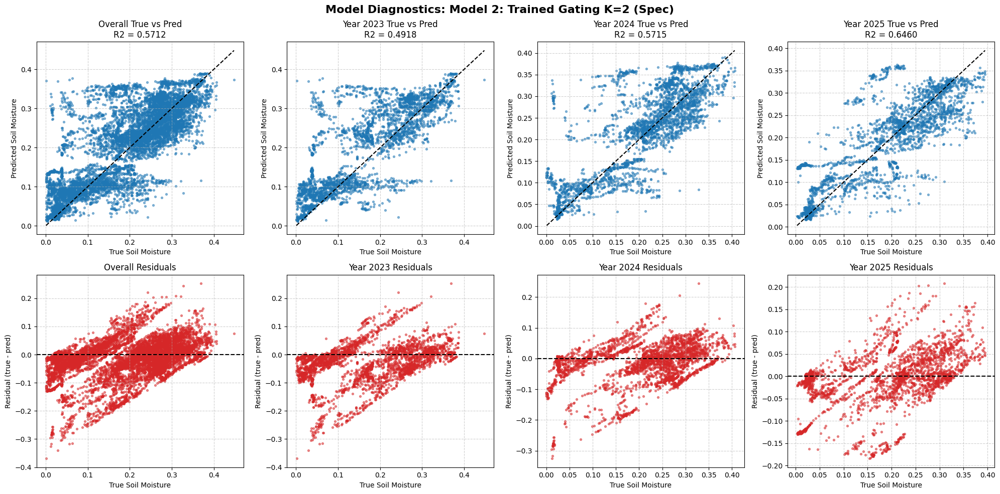


RUNNING MODEL 3: Model 3: Trained Gating K=3 (Spec)


Loaded weights from model_3:_trained_gating_k=3_(spec)_clf_gating.json
Gating classifier performance on test set:
  Accuracy:  0.7407
  F1-Score:  0.7013
  Confusion Matrix:
[[2861  243  253]
 [ 541  911 1019]
 [  58  194 2822]]


Loaded weights from model_3:_trained_gating_k=3_(spec)_specialist_0_reg.json


Loaded weights from model_3:_trained_gating_k=3_(spec)_specialist_1_reg.json


Loaded weights from model_3:_trained_gating_k=3_(spec)_specialist_2_reg.json
Overall test score R2 = 0.5419


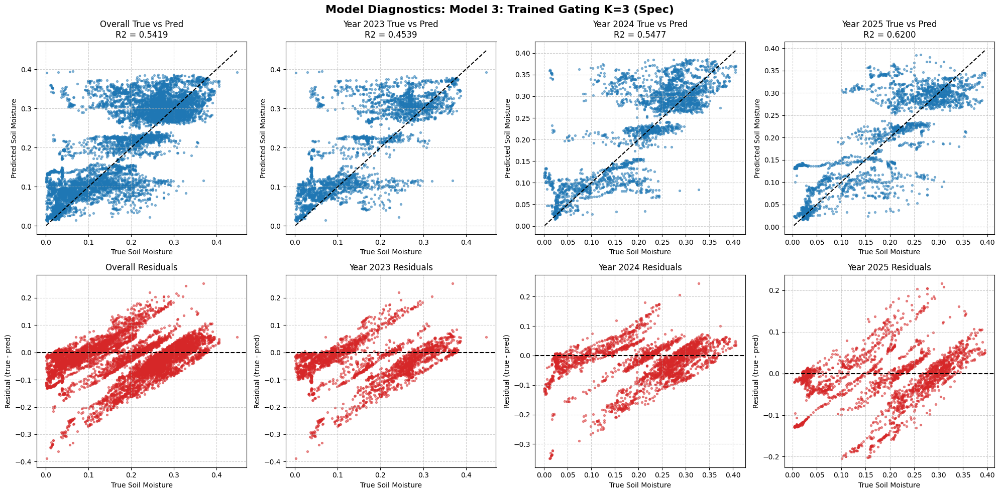


RUNNING MODEL 4: Model 4: Trained Gating K=2 (V3)


Loaded weights from model_4:_trained_gating_k=2_(v3)_clf_gating.json
Gating classifier performance on test set:
  Accuracy:  0.8729
  F1-Score:  0.8645
  Confusion Matrix:
[[2771  586]
 [ 545 5000]]


Loaded weights from model_4:_trained_gating_k=2_(v3)_specialist_0_reg.json


Loaded weights from model_4:_trained_gating_k=2_(v3)_specialist_1_reg.json
Overall test score R2 = 0.5778


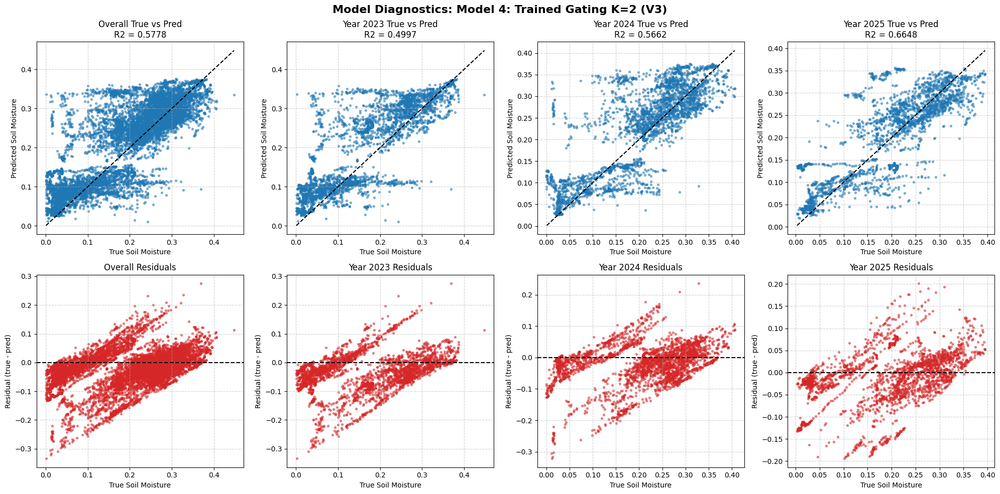


RUNNING MODEL 5: Model 5: Trained Gating K=3 (V3)


Loaded weights from model_5:_trained_gating_k=3_(v3)_clf_gating.json
Gating classifier performance on test set:
  Accuracy:  0.7407
  F1-Score:  0.7013
  Confusion Matrix:
[[2861  243  253]
 [ 541  911 1019]
 [  58  194 2822]]


Loaded weights from model_5:_trained_gating_k=3_(v3)_specialist_0_reg.json


Loaded weights from model_5:_trained_gating_k=3_(v3)_specialist_1_reg.json


Loaded weights from model_5:_trained_gating_k=3_(v3)_specialist_2_reg.json
Overall test score R2 = 0.5663


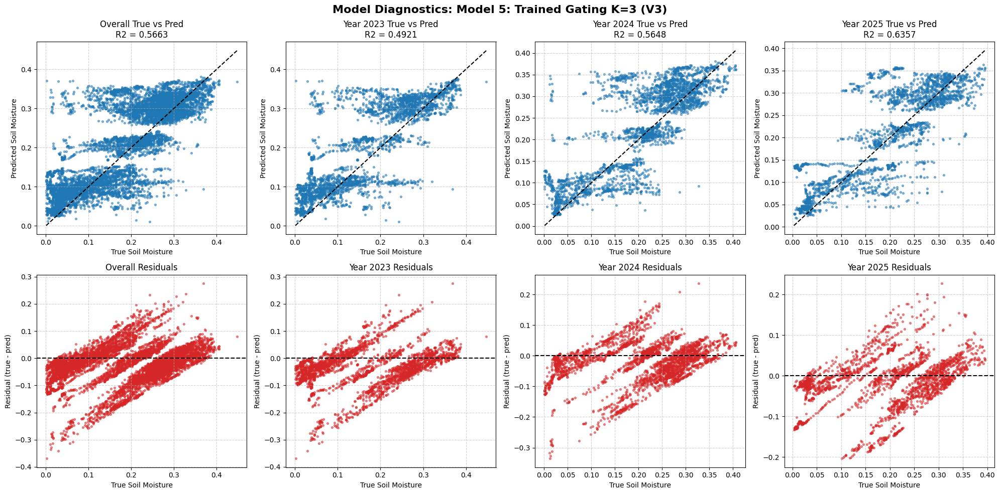


RUNNING MODEL 6: Model 6: Univariate G_API K=2
Training specialist 0 (N=11249)...


Saved weights to model_6:_univariate_g_api_k=2_specialist_0_reg.json
Training specialist 1 (N=11604)...


c:\Users\pan\Documents\GitHub\MDR-Project\notebooks\.venv\Lib\site-packages\xgboost\core.py:751: UserWarning: [16:40:16] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\common\error_msg.cc:62: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  return func(**kwargs)


Saved weights to model_6:_univariate_g_api_k=2_specialist_1_reg.json
Overall test score R2 = 0.5395


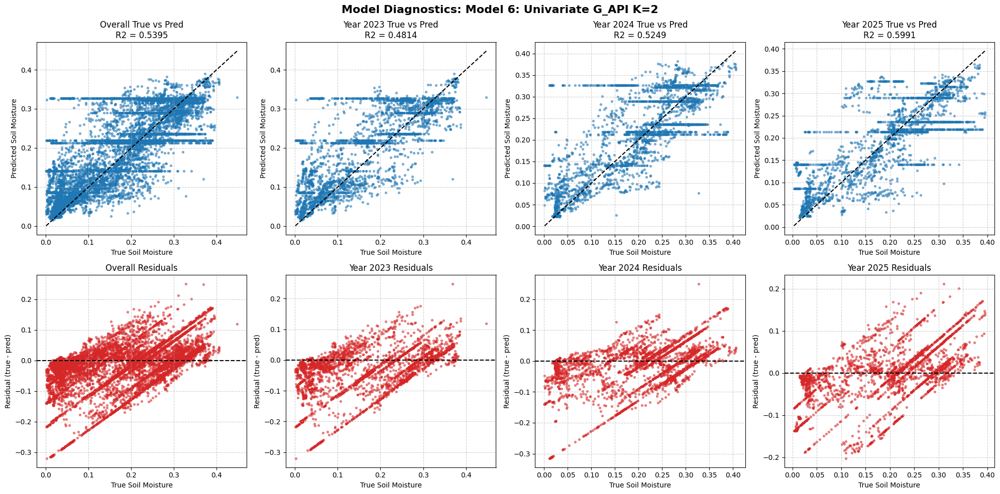


RUNNING MODEL 7: Model 7: Clustering Dynamic K=2


Training specialist 0 (N=12059)...


Saved weights to model_7:_clustering_dynamic_k=2_specialist_0_reg.json
Training specialist 1 (N=10794)...


Saved weights to model_7:_clustering_dynamic_k=2_specialist_1_reg.json
Overall test score R2 = 0.6273


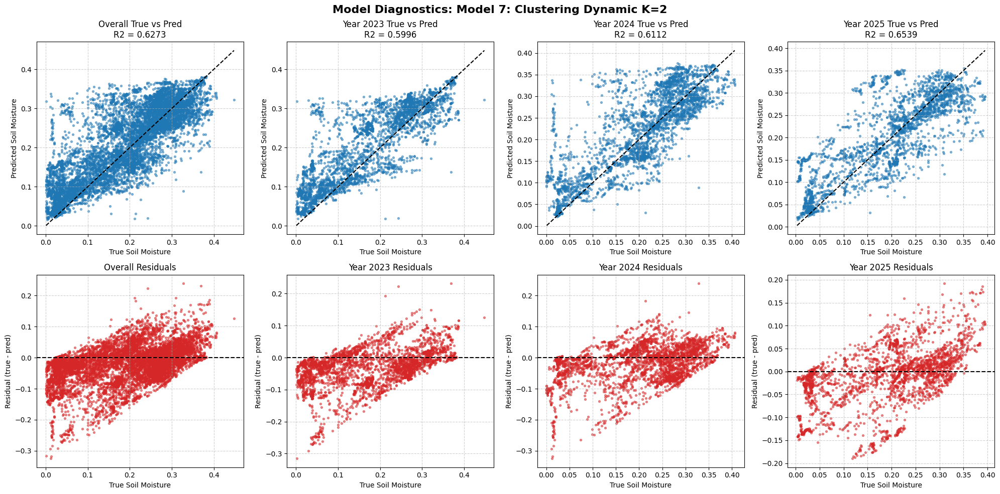


RUNNING MODEL 8: Model 8: Seasonal Binary K=2
Training specialist 0 (N=11519)...


Saved weights to model_8:_seasonal_binary_k=2_specialist_0_reg.json
Training specialist 1 (N=11334)...


Saved weights to model_8:_seasonal_binary_k=2_specialist_1_reg.json
Overall test score R2 = 0.5970


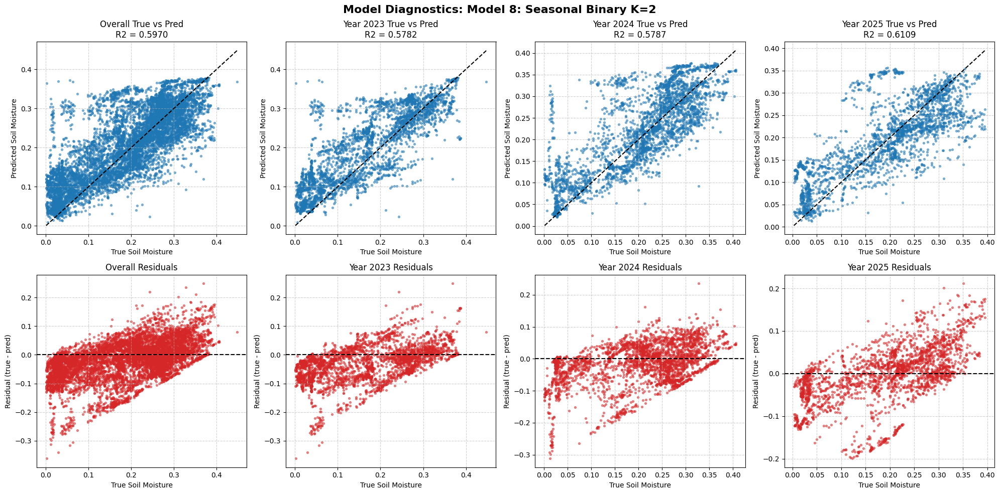


RUNNING MODEL 9: Model 9: Clustering V3 Full K=3


Training specialist 0 (N=8069)...


Saved weights to model_9:_clustering_v3_full_k=3_specialist_0_reg.json
Training specialist 1 (N=4811)...


Saved weights to model_9:_clustering_v3_full_k=3_specialist_1_reg.json
Training specialist 2 (N=9973)...


Saved weights to model_9:_clustering_v3_full_k=3_specialist_2_reg.json
Overall test score R2 = 0.6336


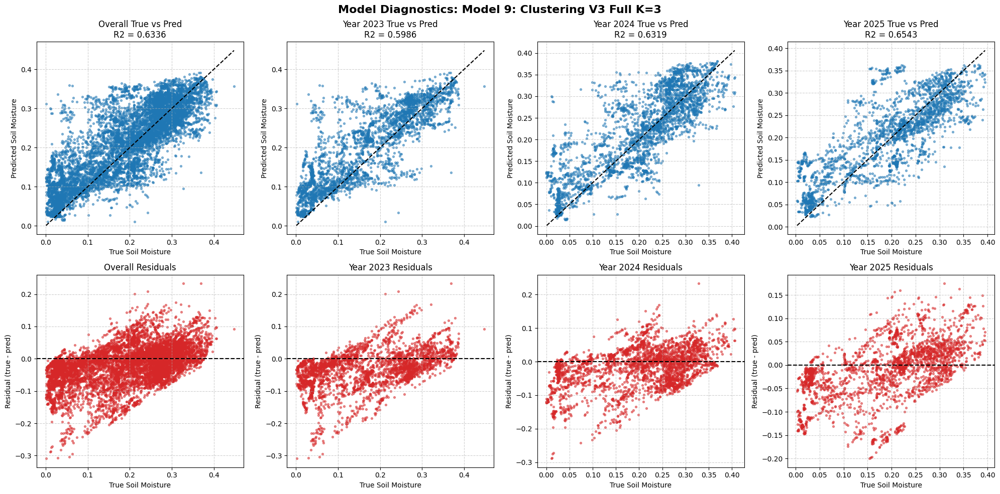


RUNNING MODEL 10: Model 10: Clustering Dynamic K=3
Training specialist 0 (N=10299)...


Saved weights to model_10:_clustering_dynamic_k=3_specialist_0_reg.json
Training specialist 1 (N=5510)...


Saved weights to model_10:_clustering_dynamic_k=3_specialist_1_reg.json
Training specialist 2 (N=7044)...


Saved weights to model_10:_clustering_dynamic_k=3_specialist_2_reg.json
Overall test score R2 = 0.6284


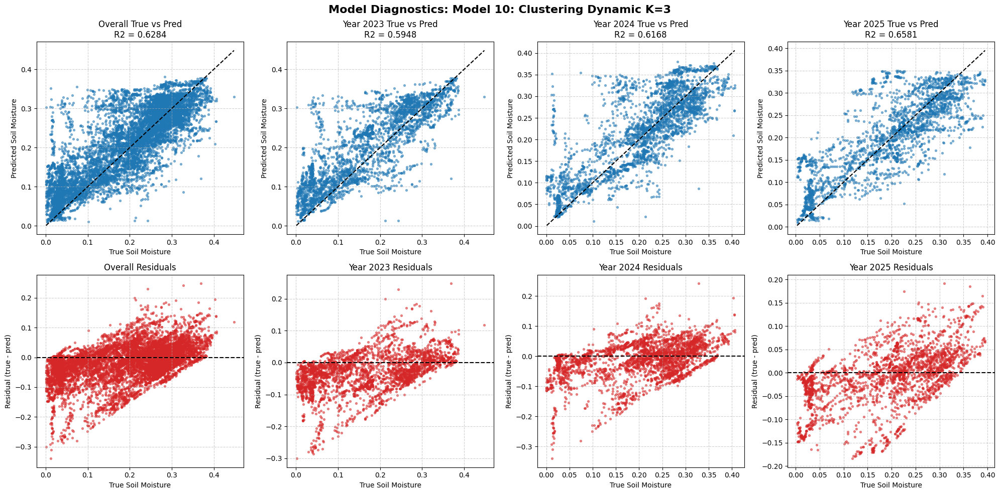


RUNNING MODEL 11: Model 11: Univariate G_API K=3
Training specialist 0 (N=7742)...


Saved weights to model_11:_univariate_g_api_k=3_specialist_0_reg.json
Training specialist 1 (N=7125)...


Saved weights to model_11:_univariate_g_api_k=3_specialist_1_reg.json
Training specialist 2 (N=7986)...


Saved weights to model_11:_univariate_g_api_k=3_specialist_2_reg.json
Overall test score R2 = 0.5465


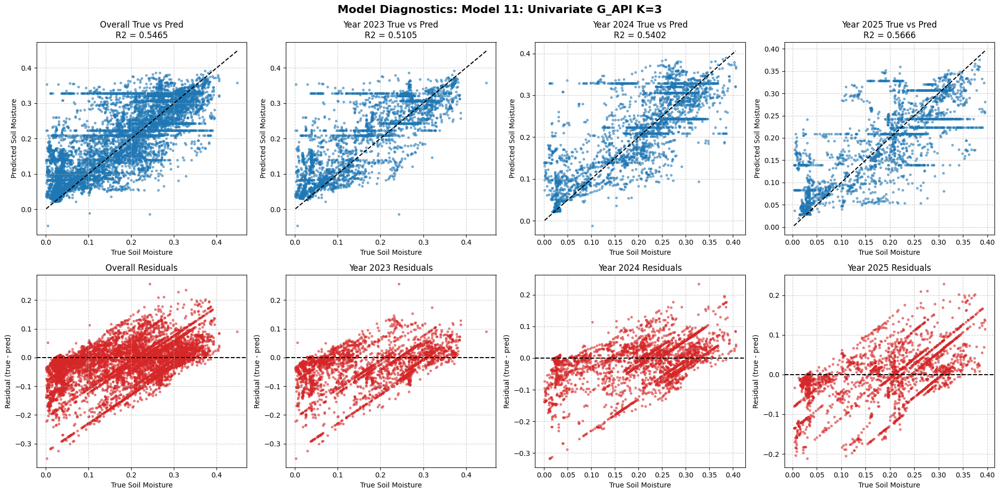

In [6]:
# Define common XGBoost Regressor parameters from derived_8.2-hyperparameters-1.3-lite
XGB_REG_PARAMS = {
    "objective": "reg:squarederror",
    "max_depth": 8,
    "min_child_weight": 10,
    "reg_lambda": 1.5,
    "reg_alpha": 0.03,
    "subsample": 0.9,
    "colsample_bytree": 0.8,
    "n_estimators": 1500,
    "learning_rate": 0.01,
    "random_state": SEED,
    "n_jobs": -1,
    "device": XGB_DEVICE
}

# Define list of models and configurations
# We will define the 11 models
models_config = [
    {"id": 1, "name": "Model 1: Baseline V3", "type": "baseline", "K": 1},
    {"id": 2, "name": "Model 2: Trained Gating K=2 (Spec)", "type": "trained_gating_specialist", "K": 2},
    {"id": 3, "name": "Model 3: Trained Gating K=3 (Spec)", "type": "trained_gating_specialist", "K": 3},
    {"id": 4, "name": "Model 4: Trained Gating K=2 (V3)", "type": "trained_gating_v3", "K": 2},
    {"id": 5, "name": "Model 5: Trained Gating K=3 (V3)", "type": "trained_gating_v3", "K": 3},
    {"id": 6, "name": "Model 6: Univariate G_API K=2", "type": "clustering_gating", "K": 2, "strat": "Univariate_G_API_k2"},
    {"id": 7, "name": "Model 7: Clustering Dynamic K=2", "type": "clustering_gating", "K": 2, "strat": "Clustering_Dynamic_k2"},
    {"id": 8, "name": "Model 8: Seasonal Binary K=2", "type": "clustering_gating", "K": 2, "strat": "Seasonal_Binary_k2"},
    {"id": 9, "name": "Model 9: Clustering V3 Full K=3", "type": "clustering_gating", "K": 3, "strat": "Clustering_V3_Full_k3"},
    {"id": 10, "name": "Model 10: Clustering Dynamic K=3", "type": "clustering_gating", "K": 3, "strat": "Clustering_Dynamic_k3"},
    {"id": 11, "name": "Model 11: Univariate G_API K=3", "type": "clustering_gating", "K": 3, "strat": "Univariate_G_API_k3"},
]

# Containers for results
overall_metrics = []
yearly_metrics = []
gating_perf_metrics = []

test_years = sorted(test_df["year"].unique())

# Prepare features/labels matrices
X_trval_v3 = trainval_df[FEATURE_SET_V3]
y_trval = trainval_df[TARGET_COL].values
X_te_v3 = test_df[FEATURE_SET_V3]
y_te = test_df[TARGET_COL].values

for cfg_m in models_config:
    mid = cfg_m["id"]
    mname = cfg_m["name"]
    mtype = cfg_m["type"]
    K = cfg_m["K"]
    
    print(f"\n==================================================")
    print(f"RUNNING MODEL {mid}: {mname}")
    print(f"==================================================")
    
    pred_test = np.zeros(len(test_df))
    
    if mtype == "baseline":
        model = XGBRegressor(**XGB_REG_PARAMS)
        if not load_model(model, mname):
            print("Training baseline model...")
            model.fit(X_trval_v3, y_trval, verbose=False)
            save_model(model, mname)
        pred_test = np.asarray(model.predict(X_te_v3)).ravel()
        
    elif mtype in ["trained_gating_specialist", "trained_gating_v3"]:
        # True gating labels for training
        if K == 2:
            y_gate_trval = np.where(y_trval < T_BINARY, 0, 1)
            y_gate_te = np.where(y_te < T_BINARY, 0, 1)
        else:
            y_gate_trval = np.select([y_trval < T_TERNARY_DRY, y_trval < T_TERNARY_WET], [0, 1], default=2)
            y_gate_te = np.select([y_te < T_TERNARY_DRY, y_te < T_TERNARY_WET], [0, 1], default=2)
            
        # Train or load gating classifier
        gating_params = {
            "objective": "multi:softprob" if K == 3 else "binary:logistic",
            "max_depth": 8,
            "min_child_weight": 10,
            "reg_lambda": 1.5,
            "reg_alpha": 0.03,
            "subsample": 0.9,
            "colsample_bytree": 0.8,
            "n_estimators": 1500,
            "learning_rate": 0.01,
            "random_state": SEED,
            "n_jobs": -1,
            "device": XGB_DEVICE
        }
        if K == 3:
            gating_params["num_class"] = 3
            
        gating_clf = XGBClassifier(**gating_params)
        if not load_model(gating_clf, mname, suffix="gating", is_classifier=True):
            print("Training gating classifier...")
            gating_clf.fit(X_trval_v3, y_gate_trval, verbose=False)
            save_model(gating_clf, mname, suffix="gating", is_classifier=True)
            
        # Predict gating labels on test set
        pred_gate_te = gating_clf.predict(X_te_v3)
        
        # Measure gating performance
        acc = accuracy_score(y_gate_te, pred_gate_te)
        prec, rec, f1, _ = precision_recall_fscore_support(y_gate_te, pred_gate_te, average="macro")
        cm_mat = confusion_matrix(y_gate_te, pred_gate_te)
        
        gating_perf_metrics.append({
            "Model Name": mname,
            "K": K,
            "Accuracy": acc,
            "Precision": prec,
            "Recall": rec,
            "F1": f1
        })
        print(f"Gating classifier performance on test set:")
        print(f"  Accuracy:  {acc:.4f}")
        print(f"  F1-Score:  {f1:.4f}")
        print(f"  Confusion Matrix:\n{cm_mat}")
        
        # Train or load specialists
        specialists = []
        for c in range(K):
            spec_name = f"{mname}_specialist_{c}"
            specialist = XGBRegressor(**XGB_REG_PARAMS)
            
            # Sub-sample trainval data for specialist
            mask_trval = (y_gate_trval == c)
            X_trval_sub = trainval_df[mask_trval]
            y_trval_sub = y_trval[mask_trval]
            
            # Determine features
            if mtype == "trained_gating_specialist":
                if K == 2:
                    feats = REGIME_FEATURES["binary"]["dry" if c == 0 else "wet"]
                else:
                    regimes_k3 = ["dry", "transition", "wet"]
                    feats = REGIME_FEATURES["ternary"][regimes_k3[c]]
            else:
                feats = FEATURE_SET_V3
                
            if not load_model(specialist, spec_name):
                print(f"Training specialist {c} (N={mask_trval.sum()})...")
                specialist.fit(X_trval_sub[feats], y_trval_sub, verbose=False)
                save_model(specialist, spec_name)
                
            specialists.append(specialist)
            
            # Predict for test samples routed to this specialist
            mask_te = (pred_gate_te == c)
            if mask_te.any():
                pred_test[mask_te] = np.asarray(specialists[c].predict(test_df.loc[mask_te, feats])).ravel()
                
    elif mtype == "clustering_gating":
        strat_name = cfg_m["strat"]
        # Define columns and fit binner/clusterer on train split
        # We need original train_df to fit
        if strat_name.startswith("Univariate_"):
            col_name = "G_API"
            binner = QuantileBinner(K)
            binner.fit(train_df[col_name])
            labels_trval = binner.predict(trainval_df[col_name])
            labels_te = binner.predict(test_df[col_name])
        elif strat_name == "Seasonal_Binary_k2":
            cond_k2_trval = [
                trainval_df['month'].isin([5, 6, 7, 8, 9, 10]),
                trainval_df['month'].isin([11, 12, 1, 2, 3, 4])
            ]
            labels_trval = np.select(cond_k2_trval, [0, 1], default=0)
            
            cond_k2_te = [
                test_df['month'].isin([5, 6, 7, 8, 9, 10]),
                test_df['month'].isin([11, 12, 1, 2, 3, 4])
            ]
            labels_te = np.select(cond_k2_te, [0, 1], default=0)
        elif "Dynamic" in strat_name:
            cols_dyn = ["SMAP_sm_pm_interp_lag1", "G_API", "LST_modis"]
            clusterer = KMeansClusterer(cols_dyn, K)
            clusterer.fit(train_df)
            labels_trval = clusterer.predict(trainval_df)
            labels_te = clusterer.predict(test_df)
        elif "V3_Full" in strat_name:
            clusterer = KMeansClusterer(FEATURE_SET_V3, K)
            clusterer.fit(train_df)
            labels_trval = clusterer.predict(trainval_df)
            labels_te = clusterer.predict(test_df)
            
        specialists = []
        for c in range(K):
            spec_name = f"{mname}_specialist_{c}"
            specialist = XGBRegressor(**XGB_REG_PARAMS)
            
            # Sub-sample trainval data for specialist
            mask_trval = (labels_trval == c)
            X_trval_sub = trainval_df[mask_trval]
            y_trval_sub = y_trval[mask_trval]
            
            # Load features
            feats = cluster_features[strat_name][str(c)]
            
            if not load_model(specialist, spec_name):
                print(f"Training specialist {c} (N={mask_trval.sum()})...")
                specialist.fit(X_trval_sub[feats], y_trval_sub, verbose=False)
                save_model(specialist, spec_name)
                
            specialists.append(specialist)
            
            # Predict for test samples in this cluster
            mask_te = (labels_te == c)
            if mask_te.any():
                pred_test[mask_te] = np.asarray(specialists[c].predict(test_df.loc[mask_te, feats])).ravel()
                
    # Evaluate overall performance
    metrics_ov = compute_metrics(y_te, pred_test)
    metrics_ov["Model Name"] = mname
    overall_metrics.append(metrics_ov)
    print(f"Overall test score R2 = {metrics_ov['R2']:.4f}")
    
    # Evaluate yearly performance
    for yr in test_years:
        mask_yr = (test_df["year"] == yr).values
        y_yr = y_te[mask_yr]
        pred_yr = pred_test[mask_yr]
        metrics_yr = compute_metrics(y_yr, pred_yr)
        metrics_yr["Model Name"] = mname
        metrics_yr["Year"] = int(yr)
        yearly_metrics.append(metrics_yr)
        
    # Generate diagnostic plots
    plot_diagnostics(mname, y_te, pred_test, test_df, out_dir)

# Section 7: Overall Results Summary and Comparisons

We aggregate and print comparison tables for overall and yearly performance metrics, save the tables to CSV files, plot the line chart comparing R2 scores of all 11 models over the years (2023-2025), and print the gating classification metrics.

=== OVERALL METRICS COMPARISON ===
    R2   RMSE ubRMSE    Bias    MAE Med|Err| Pearson                         Model Name
0.6551 0.0618 0.0583 -0.0207 0.0464   0.0352  0.8373               Model 1: Baseline V3
0.5712 0.0690 0.0669 -0.0169 0.0487   0.0345  0.7916 Model 2: Trained Gating K=2 (Spec)
0.5419 0.0713 0.0674 -0.0231 0.0501   0.0345  0.8000 Model 3: Trained Gating K=3 (Spec)
0.5778 0.0684 0.0640 -0.0242 0.0498   0.0363  0.8100   Model 4: Trained Gating K=2 (V3)
0.5663 0.0693 0.0649 -0.0243 0.0500   0.0356  0.8112   Model 5: Trained Gating K=3 (V3)
0.5395 0.0715 0.0694 -0.0172 0.0511   0.0364  0.7626      Model 6: Univariate G_API K=2
0.6273 0.0643 0.0608 -0.0208 0.0475   0.0355  0.8205    Model 7: Clustering Dynamic K=2
0.5970 0.0669 0.0644 -0.0179 0.0497   0.0384  0.7951       Model 8: Seasonal Binary K=2
0.6336 0.0637 0.0602 -0.0209 0.0477   0.0366  0.8234    Model 9: Clustering V3 Full K=3
0.6284 0.0642 0.0613 -0.0190 0.0477   0.0368  0.8164   Model 10: Clustering Dynamic K

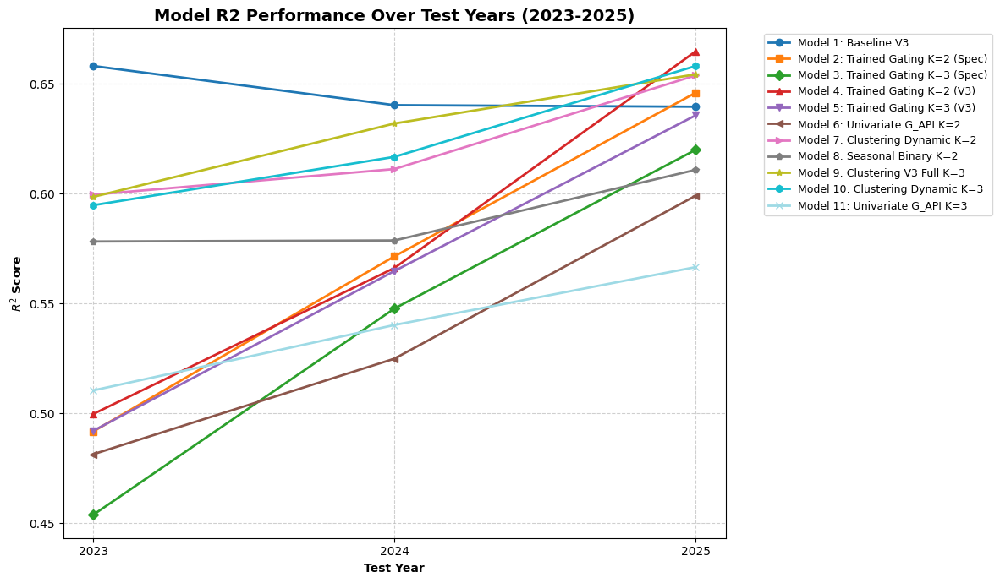


=== GATING ROUTER CLASSIFICATION PERFORMANCE ===
                        Model Name  K  Accuracy  Precision   Recall       F1
Model 2: Trained Gating K=2 (Spec)  2  0.872950   0.865370 0.863576 0.864451
Model 3: Trained Gating K=3 (Spec)  3  0.740732   0.730665 0.712983 0.701283
  Model 4: Trained Gating K=2 (V3)  2  0.872950   0.865370 0.863576 0.864451
  Model 5: Trained Gating K=3 (V3)  3  0.740732   0.730665 0.712983 0.701283
Saved gating metrics to: C:\Users\pan\Documents\GitHub\MDR-Project\notebooks\experiment\derived_8.2-eval-3.0\gating_performance_summary.csv


In [7]:
# Create overall metrics DataFrame
overall_metrics_df = pd.DataFrame(overall_metrics)
print("=== OVERALL METRICS COMPARISON ===")
print(overall_metrics_df.to_string(index=False, formatters={
    'R2': '{:,.4f}'.format,
    'RMSE': '{:,.4f}'.format,
    'ubRMSE': '{:,.4f}'.format,
    'Bias': '{:+,.4f}'.format,
    'MAE': '{:,.4f}'.format,
    'Med|Err|': '{:,.4f}'.format,
    'Pearson': '{:,.4f}'.format
}))
overall_metrics_df.to_csv(out_dir / "metrics_summary.csv", index=False)
print(f"Saved overall metrics to: {out_dir / 'metrics_summary.csv'}")

# Create yearly metrics DataFrame
yearly_metrics_df = pd.DataFrame(yearly_metrics)
yearly_metrics_df.to_csv(out_dir / "metrics_by_year.csv", index=False)
print(f"Saved yearly metrics to: {out_dir / 'metrics_by_year.csv'}")

# Print yearly breakdown
for yr in test_years:
    df_yr = yearly_metrics_df[yearly_metrics_df["Year"] == yr]
    print(f"\n--- Test Year: {int(yr)} ---")
    print(df_yr.to_string(index=False, formatters={
        'R2': '{:,.4f}'.format,
        'RMSE': '{:,.4f}'.format,
        'ubRMSE': '{:,.4f}'.format,
        'Bias': '{:+,.4f}'.format,
        'MAE': '{:,.4f}'.format,
        'Med|Err|': '{:,.4f}'.format,
        'Pearson': '{:,.4f}'.format
    }))

# Plot performance over years line chart
plot_yearly_performance_linechart(yearly_metrics_df, out_dir)

# Create gating classification metrics DataFrame
if len(gating_perf_metrics) > 0:
    gating_perf_df = pd.DataFrame(gating_perf_metrics)
    print("\n=== GATING ROUTER CLASSIFICATION PERFORMANCE ===")
    print(gating_perf_df.to_string(index=False))
    gating_perf_df.to_csv(out_dir / "gating_performance_summary.csv", index=False)
    print(f"Saved gating metrics to: {out_dir / 'gating_performance_summary.csv'}")